# 1. Importing library and data

In [11]:
#Importing libraries and modules
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import cv2
import matplotlib.image as mpimg

from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image 
from tensorflow.keras.layers import Dense

# 2. Modeling

The approaches use in modeling mainly is through the choice and hypertuning of the CNN architectures that are pre-trained. This is due to the niche image data available and would have require large amount of images to train our own CNN architecture. [MobileNet](https://medium.com/@godeep48/an-overview-on-mobilenet-an-efficient-mobile-vision-cnn-f301141db94d) would be use as our first choice due to its relatively lower parameters than other architectures which requires less computational resources. Further CNN architecture would also be explored if necessary. All epochs iteration of each model will be logged for loading for predictions during evaluations.

- Accuracy will be use as the metric to evaluate the effectiveness of the model due to its relatively balanced dataset between the classes. 
- [Adam](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/) optimizer is used as recommended in the article that it takes the characteristics of 2 other commonly use optimzer, Adaptive Gradient Algorithm (AdaGrad) and Root Mean Square Propagation (RMSProp) which might be ideal as it generalizes the options available.
- Train and validation/test loss are taken into consideration when determining if the model overfits/underfits.



## 2.1 Approach 1: MobileNetV2

- Use of MobileNetV2 as a baseline to understand the likely performance based on the image data thus the choice of simple parameters is implemented here.
    - MobileNetV2 is selected here for its low computational needs
- Parameters of CNN architecture:
    - Average pooling
    - MobileNetV2 pre-trained weights loaded from Keras
- Parameters/Type of fully connected layer:
    - batch size of 32
    - Adam as choice of optimizer
    - 25 Epoch

### 2.1.1 Setting up

In [126]:
#Importing MobileNetV2 
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_input_mnv2
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

In [12]:
#Loading the Train and Validation data with the use of MobileNetV2 preprocess module
train_data = ImageDataGenerator(preprocessing_function=preprocess_input_mnv2).flow_from_directory('processed_img/Train', 
                                                                                             target_size=(224,224), 
                                                                                             class_mode='binary')

val_data = ImageDataGenerator(preprocessing_function=preprocess_input_mnv2).flow_from_directory('processed_img/Validation', 
                                                                                           target_size=(224,224), 
                                                                                           class_mode='binary')

Found 468 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


In [5]:
#Instantiate of the desired pre-trained transfer learning model
pre_trained_model = MobileNetV2(include_top=False, pooling='avg') 

#Prevent change the pre-trained model parameters during dense layer gradient descent
pre_trained_model.trainable = False

In [6]:
#Creating the FNN model architecture
trf_model = Sequential()

#Getting the weights from pre_trained_model for Transfer Learning
trf_model.add(pre_trained_model)

#Taking the 1-D vector output from CNN for classification
trf_model.add(Dense(1, activation='sigmoid'))

trf_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 1280)             2257984   
 ional)                                                          
                                                                 
 dense (Dense)               (None, 1)                 1281      
                                                                 
Total params: 2,259,265
Trainable params: 1,281
Non-trainable params: 2,257,984
_________________________________________________________________


- The instantiated MobileNetV2 is relatively lightweight in its structure and have a total of 2.2 million parameters before feeding into the fully connected layer.
- After instantiate of both the CNN and the fully connected layer, a folder for the specific model is created to keep the training logs of each epochs for callback to make predictions for evaluation.

In [7]:
#Naming the folder by the model's name
foldername= 'MobileNetV2_model'

#Creating folder to store training logs
if not os.path.exists(foldername):
    os.makedirs(foldername)

#Defining the filepath pattern for saving the models
checkpoint_filepath = os.path.join(foldername, 'model.{epoch:02d}.h5')

#Defining the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(filepath=checkpoint_filepath)

### 2.1.2 Training of model

In [8]:
#Compile the model 
opt = Adam(learning_rate=0.001) # specify Adam optimizer
trf_model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['Accuracy']) 

#Fit model on training data 
history = trf_model.fit(train_data, 
                        batch_size=32,
                        validation_data=val_data, 
                        epochs=25, callbacks= [checkpoint_callback]
                       )

Epoch 1/25
15/15 [==============================] - 12s 672ms/step - loss: 0.5550 - Accuracy: 0.7329 - val_loss: 0.4246 - val_Accuracy: 0.8200
Epoch 2/25
15/15 [==============================] - 8s 552ms/step - loss: 0.3860 - Accuracy: 0.8504 - val_loss: 0.3062 - val_Accuracy: 0.9100
Epoch 3/25
15/15 [==============================] - 8s 543ms/step - loss: 0.3073 - Accuracy: 0.8910 - val_loss: 0.2483 - val_Accuracy: 0.9400
Epoch 4/25
15/15 [==============================] - 8s 553ms/step - loss: 0.2730 - Accuracy: 0.8932 - val_loss: 0.2200 - val_Accuracy: 0.9600
Epoch 5/25
15/15 [==============================] - 8s 540ms/step - loss: 0.2498 - Accuracy: 0.9038 - val_loss: 0.1974 - val_Accuracy: 0.9500
Epoch 6/25
15/15 [==============================] - 8s 555ms/step - loss: 0.2311 - Accuracy: 0.9145 - val_loss: 0.1841 - val_Accuracy: 0.9700
Epoch 7/25
15/15 [==============================] - 8s 542ms/step - loss: 0.2166 - Accuracy: 0.9145 - val_loss: 0.1747 - val_Accuracy: 0.9700
Epoch

###  2.1.3 Performance Evaluation

#### 2.1.3.1 Test and Train dataset

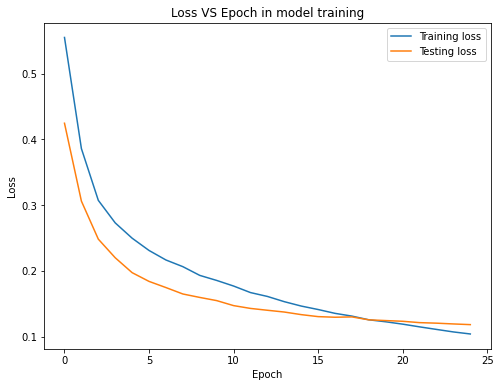

In [12]:
#Plot of loss of train and test
train_loss=history.history['loss']
test_loss=history.history['val_loss']

plt.figure(figsize=(8,6))

plt.plot(train_loss, label='Training loss')
plt.plot(test_loss, label='Testing loss')

plt.title('Loss VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend();

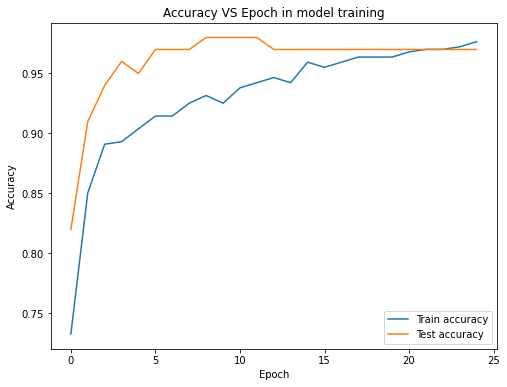

In [13]:
#Plot of test and train accuracy
plt.figure(figsize=(8,6))

plt.plot(history.history['Accuracy'], label='Train accuracy')
plt.plot(history.history['val_Accuracy'], label='Test accuracy')

plt.title('Accuracy VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend();

Conclusion:
- The train and test loss reduces consistently with increasing epoch iterations where epoch above 19 shows sign of divergence suggesting overfitting. Likewise after the 19th epoch the train accuracy begins to be above the test accuracy.
- Both train and test accuracy improves with more epoch iterations reaching 0.96 and 0.97 accuracy respectively at the optimal epoch iteration of 19.
- The average training time for each epoch iteration is about 8 seconds.
- The model produce satisfactory results with no overfitting issues however further approaches will be explored in attempt to further improve the score and the images that were misclassified will be analyzed.

In [70]:
#Load the model from the optimal epoch: 19th epoch
model_path01 = 'MobileNetV2_model/model.19.h5' 
loaded_model01 = tf.keras.models.load_model(model_path01)

##### Misclassification

In [131]:
def misclassified_img(model,parentfilepath,val_data, preprocess_input=None):    
    '''Function to get image filepath of misclassified samples from the optimal model selected '''
    #Creating an empty list to store the preprocessed images
    preprocessed_images = []
    
    #Iterate over each image in val_data and apply preprocessing
    for image_path in val_data.filenames:
        #Load the image
        img = image.load_img(f'{parentfilepath}/{image_path}')  

        #Converting the image to a matrix of numbers
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        
        if preprocess_input is not None:
            img_array = preprocess_input(img_array)

        #Appending the preprocessed image to the list
        preprocessed_images.append(img_array)

    #Converting the list of preprocessed images to a numpy array
    preprocessed_images = np.vstack(preprocessed_images)

    #Making predictions on the preprocessed images
    predictions = model.predict(preprocessed_images)

    #Converting probabilities to binary predictions based on a threshold of 0.5
    predicted_classes = (predictions > 0.5).astype(int)

    #Compare predictions with true labels
    true_classes = val_data.classes  

    #Fetching the image names
    image_names = val_data.filenames  

    #Identifying misclassified samples
    misclassified_mask = predicted_classes[:, 0] != true_classes

    #Retrieve image names of misclassified samples
    return [image_names[i] for i, is_misclassified in enumerate(misclassified_mask) if is_misclassified]

In [38]:
def view_misclass(image_paths, parentfilepath, col_view):
    num_images = len(image_paths)
    num_cols = col_view
    num_rows = (num_images + num_cols - 1) // num_cols

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 15))

    for i, path in enumerate(image_paths):
        img = mpimg.imread(f'{parentfilepath}/{path}')
        ax = axs[i // num_cols, i % num_cols]
        ax.imshow(img)
        ax.axis('off')
        
        if path.startswith('disease'):
            ax.set_title('True class: Disease')
        else:
            ax.set_title('True class: Healthy')

    for i in range(num_images, num_rows * num_cols):
        axs[i // num_cols, i % num_cols].axis('off')

    plt.tight_layout()
    plt.show()

In [132]:
#Getting the image file path that were misclassified based on the selected model
misclassified_image_names=misclassified_img(loaded_model01,'processed_img/Validation', val_data, preprocess_input_mnv2)

4/4 [==============================] - 2s 485ms/step


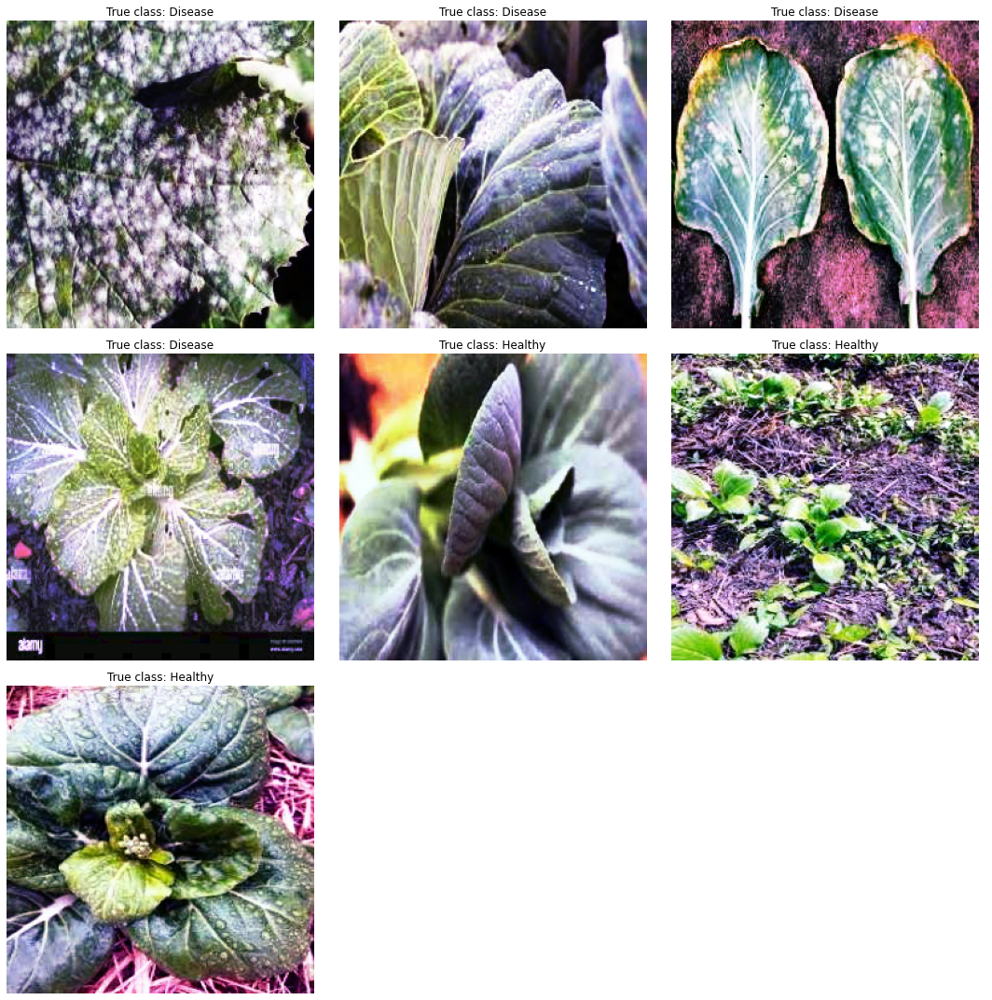

In [133]:
#View of misclassified images and their true class
view_misclass(misclassified_image_names, 'processed_img/Validation/',3)

Conclusion:
- There 4 diseased images bein misclassified as healthy and 3 healthy as diseased.
- Based on the misclassified diseased images, the common feature shared is that the blemishes are white (i.e Powdery mildew, a variation of the downy mildew) and such blemishes are too fine or too prominent.
- Based on the misclassified healthy images, the images are not in focused where it is either too zoomed out or the leaves are not capture fully in frame. Water droplets on leaves also created issue for classifying accurately.

#### 2.1.3.2 Images of vegetable with water droplets

- The augmented images with water droplets will go through the same preprocessing steps before evaluation
- Understanding that all the images are of healthy vegetables, ideally there should be a high proportion of healty classification results. It is noted that the imbalanced validation dataset here is not ideal and conclusion cannot be drawn on its accuracy in classifying diseased vegetable with water droplets on them.

In [41]:
#Preprocessing the images
preprocess_image('augmented_images', 'processed_augmented_images')

In [107]:
def water_evaluation(model):
    
    '''Function to make predictions based on processed and augmented images of the vegetable with water droplets and to return the a dataframe 
    that captures the classification results and the list of image path of misclassified images '''
    
    #Defining the folder containing the test images
    test_folder = 'processed_augmented_images'

    #Creating an empty list to store the results
    results = []
    diseased_list = []

    #Load and process each image
    for filename in os.listdir(test_folder):
        #Construct the path to the image
        image_path = os.path.join(test_folder, filename)

        #Load the image
        test_image = image.load_img(image_path)

        #Convert the image to a matrix of numbers
        test_image = image.img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis=0)
        test_image = preprocess_input(test_image)

        #Make a prediction
        result = model.predict(test_image)

        #Storing of the results
        results.append(result)
        if result[0][0] <= 0.5:  
            diseased_list.append(filename)
            
    results = np.concatenate(results, axis=0)

    #Assigning labels based on the threshold
    labels = ['Healthy' if pred[0] > 0.5 else 'Diseased' for pred in results]

    df_results = pd.DataFrame({'Classification Result': labels, 'Classification Probability': results[:, 0]})

    #Return results sorted by diseased classifcation
    return df_results, diseased_list

In [109]:
#Getting the dataframe that capture the results of classification and the misclassified image filepaths
water_result_01, image_path01=water_evaluation(loaded_model01)

1/1 [==============================] - 0s 35ms/step


##### Misclassification

In [110]:
#View of classification results
water_result_01.sort_values(by='Classification Probability')

,Classification Result,Classification Probability
44,Diseased,0.018881
18,Diseased,0.022647
24,Diseased,0.047231
37,Diseased,0.048565
28,Diseased,0.055406
5,Diseased,0.085670
17,Diseased,0.087832
32,Diseased,0.100990
21,Diseased,0.133188
13,Diseased,0.143011


In [97]:
#Proportion of classification results
water_result_01['Classification Result'].value_counts(normalize=True)

Diseased    0.733333
Healthy     0.266667
Name: Classification Result, dtype: float64

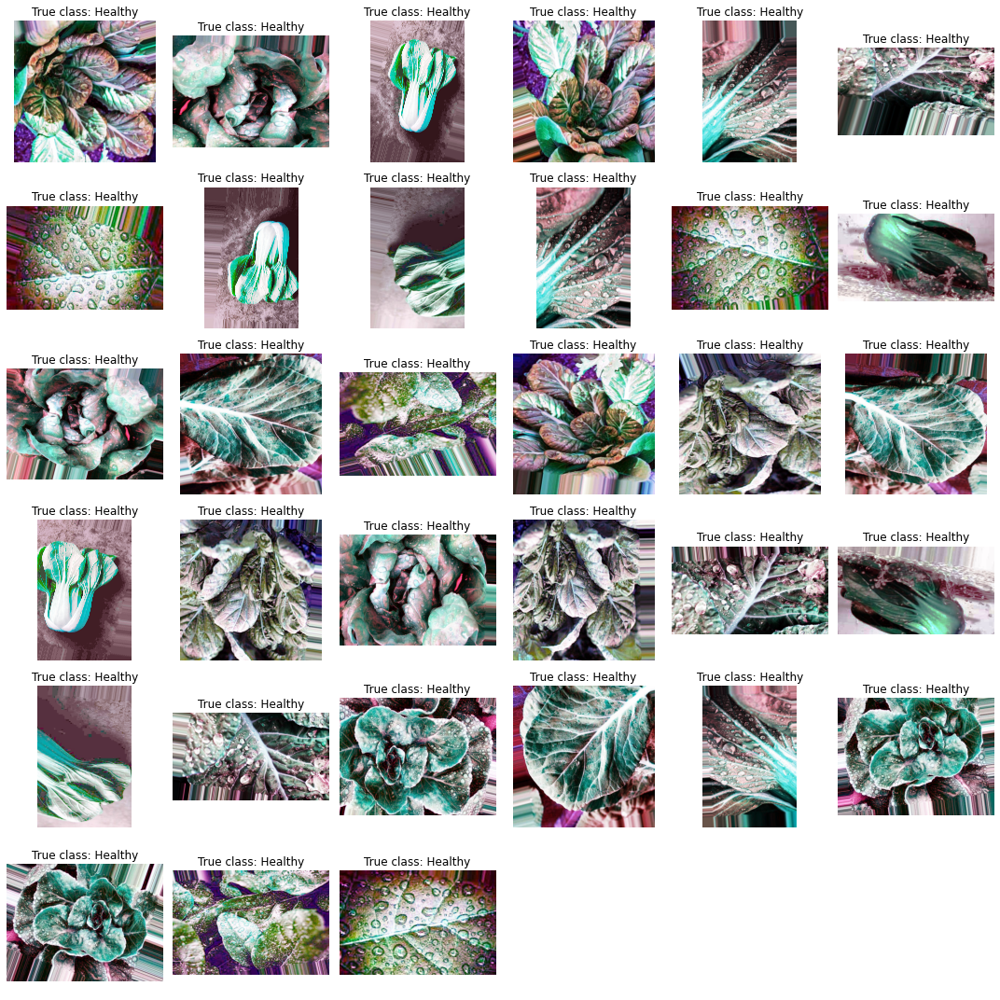

In [152]:
#View of misclassified images
view_misclass(image_path01, 'processed_augmented_images',6)

Conclusion:

- Model is poor in accurate classification.
    - The model do not perform well when classifying images with the presenece of water droplets with 27% are correctly classified. It is also observed that based on the prediction probabilities, the model is have higher tendency to classify the images towards being "diseased" implying that the model is not able to interpret water droplets are not symptoms of diseases. This is likely due to the droplets being detected by the CNN architecture as spots mistaken as the presence of downy mildew with holes on leaves.
    
- Model is "confidently" misclassifying.
    - As observed in the dataframe above, there are significant amount of classification probabilities that are very close prediction probabilities to zero. This implies that the model is confident in classfiying the images as diseased which suggest the model might produce large cases of False negatives during the presence of water droplets in images.

- From the view of the misclassified images, there are no clear features to be identified physically to provide information on reasons behind the missclassification.
- Further exploration of other approaches will be explored in attempt to resolve this.

## 2.2 Approach 2: MobileNetV3

- Use of MobileNetV3 as the CNN architecture due to one of the additional features on top of MobileNetV2 such as the ["Squeeze and Exicitation"](https://towardsdatascience.com/squeeze-and-excitation-networks-9ef5e71eacd7) feature which "compress" the image through global average pooling and understand its features (Squeeze) and rescaling the weights to emphasize on important features (Exicitation). Additionally, MobileNetV3 large(instead of small) is use due to more hyperparameters which might produce better results.
    - This could perhaps better capture the difference between water droplets and the yellow blemishes of the downy mildew.
- Other parameters are held constant for comparison to MobileNetV2 except for higher epoch iterations to prevent stopping too early before optimal results
- Parameters of CNN architecture:
    - Average pooling
    - MobileNetV3 pre-trained weights are implicit in the architecture
- Parameters/Type of fully connected layer:
    - batch size of 32
    - Adam as choice of optimizer
    - 25 Epoch

### 2.2.1 Setting up

In [19]:
#Importing MobileNetV3
from tensorflow.keras.applications import MobileNetV3Large

In [40]:
#Loading the Train and Validation data
train_data_mnv3 = ImageDataGenerator().flow_from_directory('processed_img/Train', target_size=(224,224), class_mode='binary')

val_data_mnv3 = ImageDataGenerator().flow_from_directory('processed_img/Validation', target_size=(224,224), class_mode='binary')

Found 468 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


In [108]:
# Load the MobileNetV3 model without the top (fully connected) layers
pre_trained_model_mnv3 = MobileNetV3Large(pooling='avg', include_top=False)
pre_trained_model_mnv3.trainable = False

In [109]:
#Creating the FNN model architecture
trf_model_mnv3 = Sequential()

#Getting the weights from pre_trained_model for Transfer Learning
trf_model_mnv3.add(pre_trained_model_mnv3)

#Taking the 1-D vector output from CNN for classification
trf_model_mnv3.add(Dense(1, activation='sigmoid'))

trf_model_mnv3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobilenetV3large (Functiona  (None, 960)              2996352   
 l)                                                              
                                                                 
 dense_2 (Dense)             (None, 1)                 961       
                                                                 
Total params: 2,997,313
Trainable params: 961
Non-trainable params: 2,996,352
_________________________________________________________________


- The instantiated MobileNetV3Large here have more more parameters (2.9 milion) in its architecture and a similar structure of the fully connected layer to approach 1 is added.

In [104]:
#Naming the folder by the model's name
foldername= 'MobileNetV3_model'

#Creating folder to store training logs
if not os.path.exists(foldername):
    os.makedirs(foldername)

#Defining the filepath pattern for saving the models
checkpoint_filepath_02 = os.path.join(foldername, 'model.{epoch:02d}.h5')

#Defining the ModelCheckpoint callback
checkpoint_callback_02 = ModelCheckpoint(filepath=checkpoint_filepath_02)

### 2.2.2 Training of model

In [110]:
#Compiling of the model 
opt = Adam(learning_rate=0.001)
trf_model_mnv3.compile(loss='binary_crossentropy', optimizer=opt, metrics=['Accuracy']) 

# Fit model on training data
history_mnv3 = trf_model_mnv3.fit(train_data_mnv3,
                        batch_size=32,
                        validation_data=val_data_mnv3, 
                        epochs=25, callbacks= [checkpoint_callback_02]
                       )

Epoch 1/25
15/15 [==============================] - 12s 629ms/step - loss: 0.6097 - Accuracy: 0.6560 - val_loss: 0.5452 - val_Accuracy: 0.7300
Epoch 2/25
15/15 [==============================] - 8s 569ms/step - loss: 0.4280 - Accuracy: 0.8376 - val_loss: 0.3898 - val_Accuracy: 0.8800
Epoch 3/25
15/15 [==============================] - 8s 567ms/step - loss: 0.3402 - Accuracy: 0.8654 - val_loss: 0.3145 - val_Accuracy: 0.9200
Epoch 4/25
15/15 [==============================] - 8s 566ms/step - loss: 0.2974 - Accuracy: 0.8910 - val_loss: 0.2694 - val_Accuracy: 0.9400
Epoch 5/25
15/15 [==============================] - 8s 562ms/step - loss: 0.2686 - Accuracy: 0.9103 - val_loss: 0.2437 - val_Accuracy: 0.9300
Epoch 6/25
15/15 [==============================] - 8s 559ms/step - loss: 0.2463 - Accuracy: 0.9188 - val_loss: 0.2253 - val_Accuracy: 0.9300
Epoch 7/25
15/15 [==============================] - 8s 576ms/step - loss: 0.2300 - Accuracy: 0.9295 - val_loss: 0.2113 - val_Accuracy: 0.9200
Epoch

### 2.2.3 Performance Evaluation

#### 2.2.3.1 Test and Train dataset

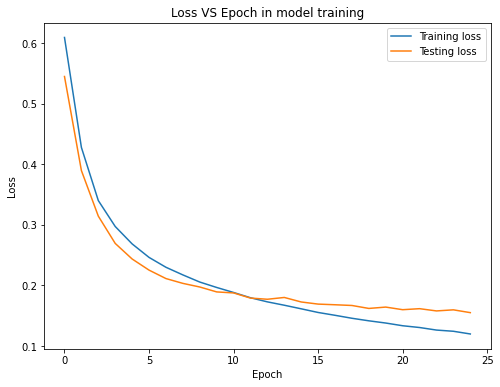

In [111]:
#Plot of loss of train and test
train_loss_mnv3=history_mnv3.history['loss']
test_loss_mnv3=history_mnv3.history['val_loss']

plt.figure(figsize=(8,6))

plt.plot(train_loss_mnv3, label='Training loss')
plt.plot(test_loss_mnv3, label='Testing loss')

plt.title('Loss VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend();

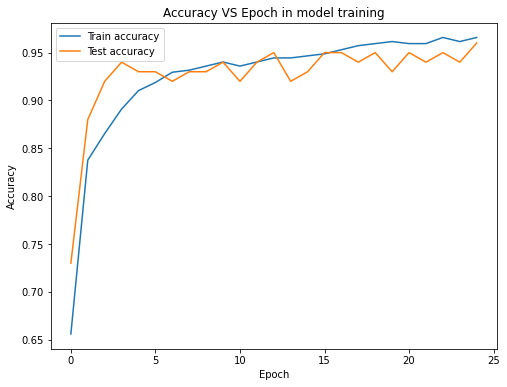

In [112]:
#Plot of train and test accuracy 
plt.figure(figsize=(8,6))

plt.plot(history_mnv3.history['Accuracy'], label='Train accuracy')
plt.plot(history_mnv3.history['val_Accuracy'], label='Test accuracy')

plt.title('Accuracy VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend();

Conclusion:
- Train and test loss beign to diverge after the 12th epoch with accuracy score of 0.94 approximately for both
- No overfitting issues but poorer performance than MobileNetV2 model
- However, based on the Accuracy VS Epoch plot, there is possibility for the train accuracy to improve with higher degree of epochs. Understanding that there are signs of overfitting past the 12th epoch, certain implementations such as Regularization, Dropout layers and Data augmentation to create larger training dataset, might allow higher epoch iterations.
- The average training time for each epoch iteration is about 8 seconds, similar to MobileNetV2.

In [75]:
# Load the model from the 12th epoch
model_path_mnv3 = 'MobileNetV3_model/model.12.h5' 
loaded_model_mnv3 = tf.keras.models.load_model(model_path_mnv3)

##### Misclassification

In [134]:
#Getting the image file path that were misclassified based on the selected model
misclassified_image_names_mnv3=misclassified_img(loaded_model_mnv3,'processed_img/Validation', val_data_mnv3)

4/4 [==============================] - 2s 425ms/step


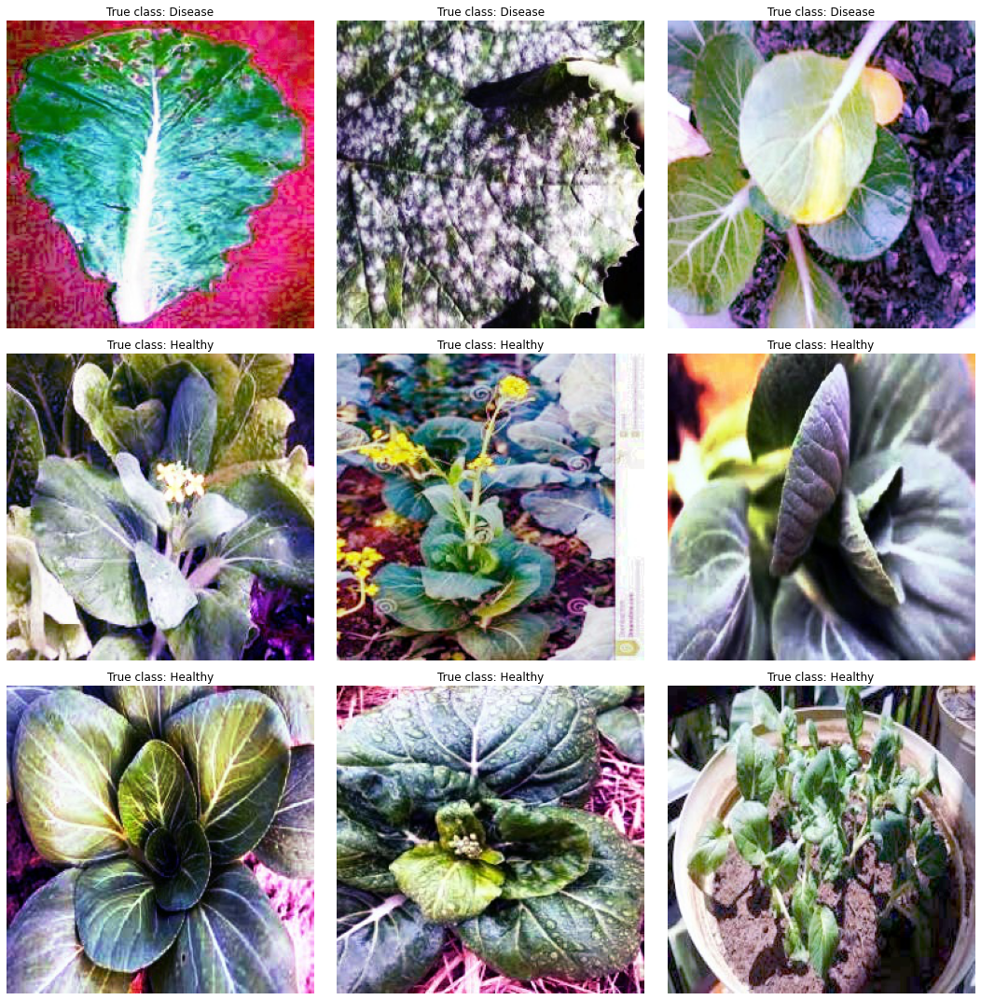

In [135]:
#View of misclassified images and their true class
view_misclass(misclassified_image_names_mnv3, 'processed_img/Validation/',3)

Conclusion:
- Some images that are misclassified under MobileNetV2 are also misclassified under MobileNetV3. (e.g Presence of water droplets)
- Majority of the misclassifications are of images of healthy vegetables suggesting that it might be more sensitive in classifying vegetables as diseased.
    - Some of the misclassified healthy vegetables have yellow flowers in the image which might cause the model to misclassified as diseased due to usual presence of yellow hues in diseased vegetables.
- Approach to increase epoch iterations with measures to reduce overfitting will be considered to enable the model to minimize such misclassifications.

#### 2.2.3.2 Images of vegetables with water droplets

##### Misclassification

In [113]:
#Getting the dataframe that capture the results of classification and the misclassified image filepaths
water_result_mnv3, image_path_mnv3 = water_evaluation(loaded_model_mnv3)

1/1 [==============================] - 0s 34ms/step


In [115]:
#View of classification results
water_result_mnv3.sort_values(by='Classification Probability')

,Classification Result,Classification Probability
37,Diseased,0.346441
16,Diseased,0.359414
35,Diseased,0.376805
32,Diseased,0.378719
6,Diseased,0.381267
11,Diseased,0.384475
25,Diseased,0.384784
24,Diseased,0.398252
17,Diseased,0.418068
18,Diseased,0.418254


In [156]:
#Proportion of classification results
water_result_mnv3['Classification Result'].value_counts(normalize=True)

Diseased    0.711111
Healthy     0.288889
Name: Classification Result, dtype: float64

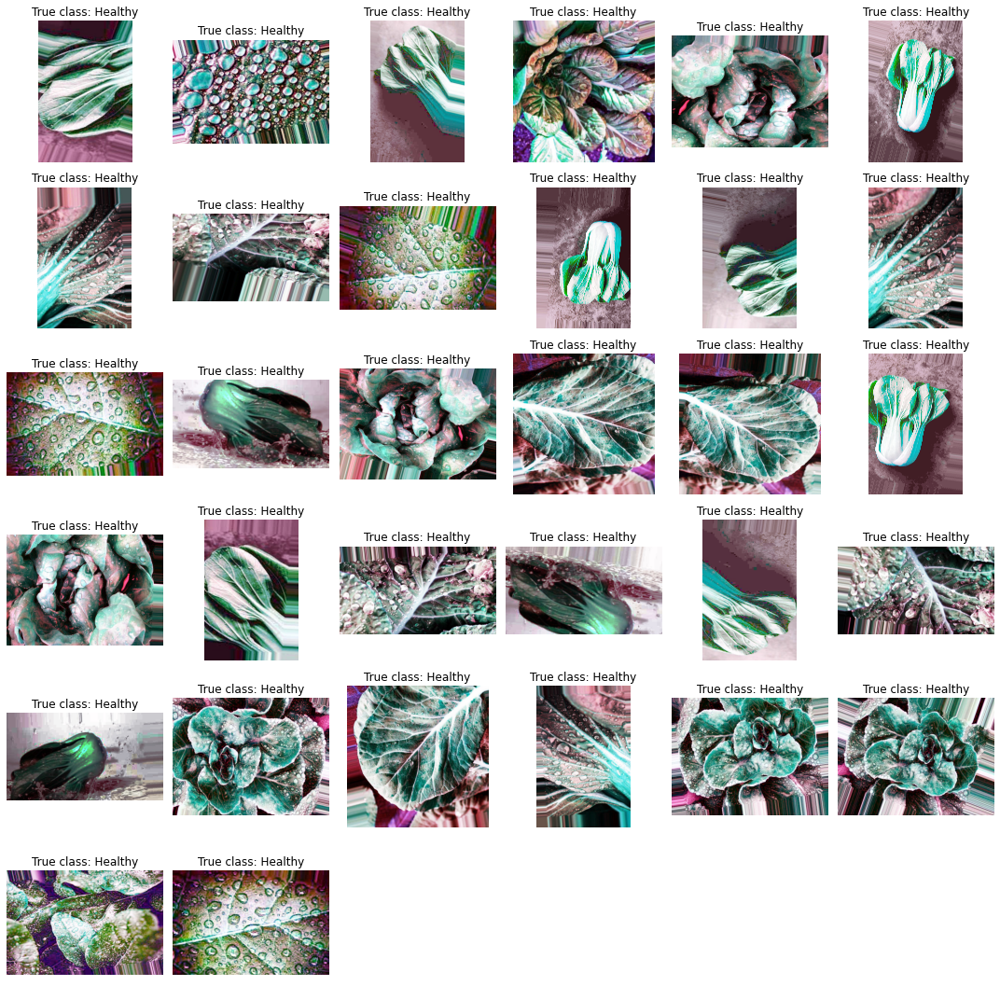

In [157]:
#View of misclassified images
view_misclass(image_path_mnv3, 'processed_augmented_images',6)

Conclusion:
- Similarly to MobileNetV2, it performs poorly, with 29% in correct classification of images of healthy vegetables with water droplets.  
- However, the range of prediction probabilities spread from 0.35 to 0.64 which centralise around the decision threshold of 0.5. 
    - This might suggest that the model are not as confident in each misclassification which suggest that it have taken better consideration of the image features as compared to the case in MobileNetV2 where the classifications were done in more confidence where the probabilities are closer to 0.

- This could imply that if the model have been adjusted to the optimal parameters it might be capable of correcting the misclassifications.

- Visually, there are also no significant characteristics or patterns to infer from that could provide information/suggestions on model improvement.

## 2.3 Approach 2B: MobileNetV3 + Regularization

- Adding [ridge regualarization](https://www.javatpoint.com/regularization-in-machine-learning) to each layer in the CNN architecture in attempt to reduce overfitting when increasing epoch iterations for training. This is in attempt to have a better trained model to better classify images with water droplets presence without the risk of overfitting.
    - Ridge is used instead of lasso as it is a less "aggresive" regularization technique where the weights of the features are reduced and not "zero-ed" out. Given the limited data available, each feature use in training would be valuable thus ridge is decided as a better choice in this context.
- For comparison, every other parameters are kept the same as approach 2 (i.e vanilla MobileNetV3) except for higher degree of epochs(to 30) to train on since it was concluded in the previous approach that there are signs where the performance can be improved.

### 2.3.1 Setting up

In [20]:
# Load the MobileNetV3 model without the top (fully connected) layers
pre_trained_model_mnv3B = MobileNetV3Large(pooling='avg', include_top=False)
pre_trained_model_mnv3B.trainable = False

In [21]:
# Add regularization (alpha = 0.01) to the layers
regularizer = tf.keras.regularizers.l2(0.01)  

for layer in pre_trained_model_mnv3B.layers:
    if hasattr(layer, 'kernel_regularizer'):
        layer.kernel_regularizer = regularizer

In [22]:
#Creating the FNN model architecture
trf_model_mnv3B = Sequential()

#Getting the weights from pre_trained_model for Transfer Learning
trf_model_mnv3B.add(pre_trained_model_mnv3B)

#Taking the 1-D vector output from CNN for classification
trf_model_mnv3B.add(Dense(1, activation='sigmoid'))

trf_model_mnv3B.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobilenetV3large (Functiona  (None, 960)              2996352   
 l)                                                              
                                                                 
 dense (Dense)               (None, 1)                 961       
                                                                 
Total params: 2,997,313
Trainable params: 961
Non-trainable params: 2,996,352
_________________________________________________________________


In [25]:
#Naming the folder by the model's name
foldername= 'MobileNetV3B_model'

#Creating folder to store training logs
if not os.path.exists(foldername):
    os.makedirs(foldername)

#Defining the filepath pattern for saving the models
checkpoint_filepath_mnv3B = os.path.join(foldername, 'model.{epoch:02d}.h5')

#Defining the ModelCheckpoint callback
checkpoint_callback_mnv3B = ModelCheckpoint(filepath=checkpoint_filepath_mnv3B)

### 2.3.2 Training of model

In [26]:
#Compiling of the model 
opt = Adam(learning_rate=0.001)
trf_model_mnv3B.compile(loss='binary_crossentropy', optimizer=opt, metrics=['Accuracy']) 

# Fit model on training data
history_mnv3B = trf_model_mnv3B.fit(train_data_mnv3,
                        batch_size=32,
                        validation_data=val_data_mnv3, 
                        epochs=30, callbacks= [checkpoint_callback_mnv3B]
                       )

Epoch 1/30
15/15 [==============================] - 14s 690ms/step - loss: 0.7837 - Accuracy: 0.5171 - val_loss: 0.6563 - val_Accuracy: 0.6300
Epoch 2/30
15/15 [==============================] - 8s 559ms/step - loss: 0.5269 - Accuracy: 0.7457 - val_loss: 0.4538 - val_Accuracy: 0.8300
Epoch 3/30
15/15 [==============================] - 9s 594ms/step - loss: 0.4032 - Accuracy: 0.8333 - val_loss: 0.3447 - val_Accuracy: 0.8900
Epoch 4/30
15/15 [==============================] - 10s 652ms/step - loss: 0.3391 - Accuracy: 0.8590 - val_loss: 0.2833 - val_Accuracy: 0.9100
Epoch 5/30
15/15 [==============================] - 8s 561ms/step - loss: 0.2939 - Accuracy: 0.8889 - val_loss: 0.2487 - val_Accuracy: 0.9000
Epoch 6/30
15/15 [==============================] - 8s 568ms/step - loss: 0.2682 - Accuracy: 0.9017 - val_loss: 0.2250 - val_Accuracy: 0.9300
Epoch 7/30
15/15 [==============================] - 8s 548ms/step - loss: 0.2498 - Accuracy: 0.9124 - val_loss: 0.2090 - val_Accuracy: 0.9200
Epoc

### 2.3.3 Performance Evaluation

#### 2.3.3.1 Test and Train dataset

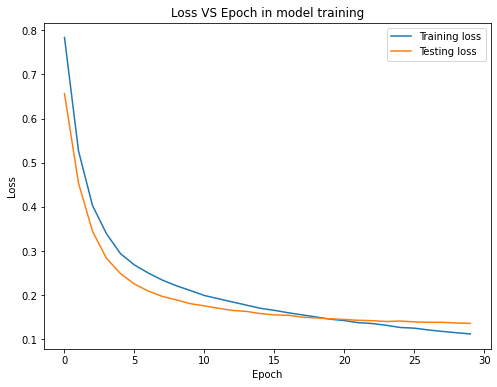

In [28]:
#Plot of loss of train and test
train_loss_mnv3B=history_mnv3B.history['loss']
test_loss_mnv3B=history_mnv3B.history['val_loss']

plt.figure(figsize=(8,6))

plt.plot(train_loss_mnv3B, label='Training loss')
plt.plot(test_loss_mnv3B, label='Testing loss')

plt.title('Loss VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend();

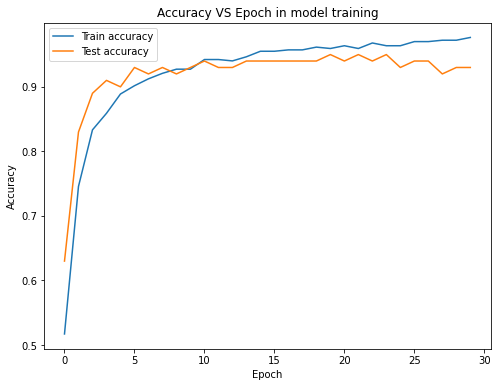

In [29]:
#Plot of train and test accuracy 
plt.figure(figsize=(8,6))

plt.plot(history_mnv3B.history['Accuracy'], label='Train accuracy')
plt.plot(history_mnv3B.history['val_Accuracy'], label='Test accuracy')

plt.title('Accuracy VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend();

Conclusion:
- Signs of divergence between train and test loss occurs after the 20th epoch thus it is selected as the optimal epoch.
- The test accuracy show signs of decline past the 20th epoch thus further training would also not be beneficial for classification on unseen data. As expected, the accuracy of train and test diverges as the epoch iteration increases from the 20th.
- Thus having regularization have enabled more epoch iteration which does improve the model performance from a test accuracy score to 0.95 (i.e ~1% improvement).
- The average training time for each epoch iteration is about 8 seconds.

In [30]:
# Load the model from the 20th epoch
model_path_mnv3B = 'MobileNetV3B_model/model.20.h5' 
loaded_model_mnv3B = tf.keras.models.load_model(model_path_mnv3B)

##### Misclassification

In [80]:
#Getting the image file path that were misclassified based on the selected model
misclassified_image_names_mnv3B = misclassified_img(loaded_model_mnv3B,'processed_img/Validation', val_data_mnv3)

4/4 [==============================] - 2s 344ms/step


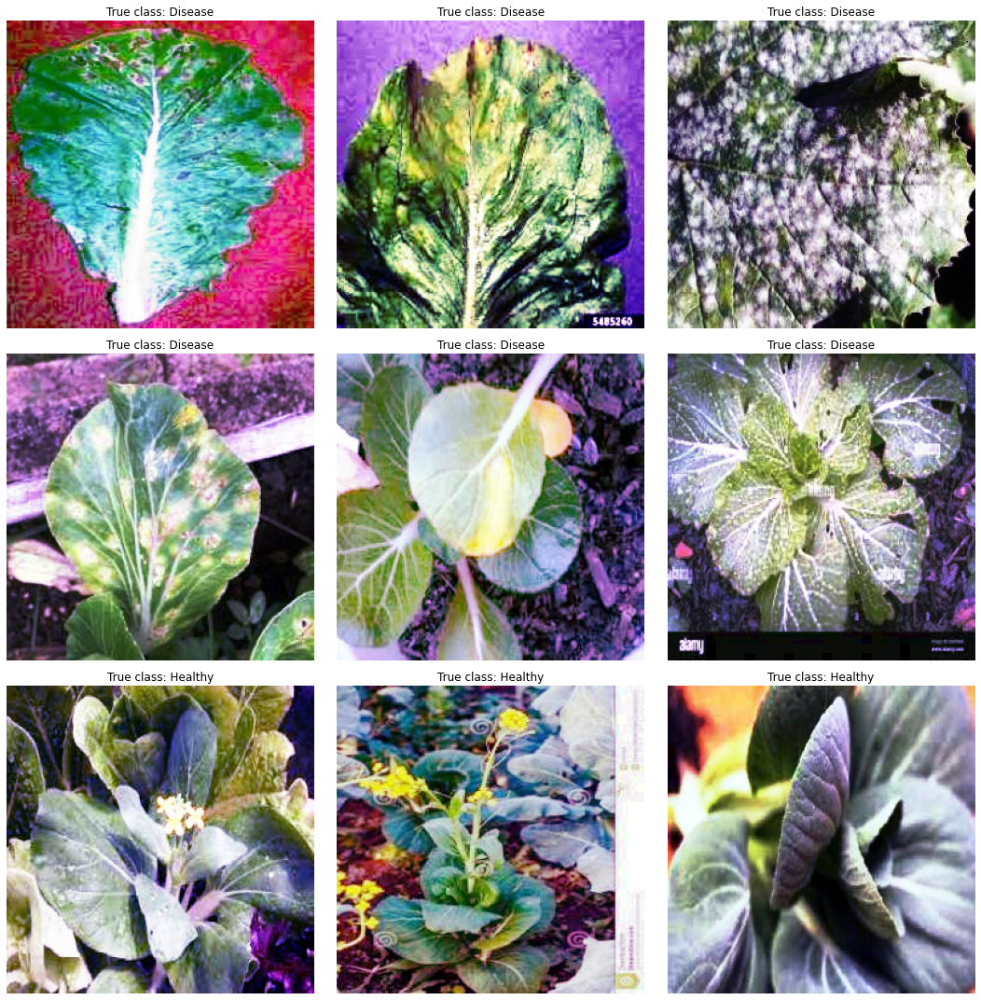

In [82]:
#View of misclassified images and their true class
view_misclass(misclassified_image_names_mnv3B, 'processed_img/Validation/',3)

Conclusion:
- Several repeated misclassified images from approach 2 with similar conclusions.
- Majority of misclassified images are of the diseased class suggesting the model might have a tendency to classify images as healthy.
- Despite higher iterations of training, the model have limited success on improving the misclassifications from the approach 2 model.
    - This could suggest that more quantity of variations of healthy vegetable images might be needed for training instead of adjusting the model's parameter.

#### 2.3.3.2 Images of vegetables with water droplets

##### Misclassification

In [116]:
#Getting the dataframe that capture the results of classification and the misclassified image filepaths
water_result_mnv3B, image_path_mnv3B =water_evaluation(loaded_model_mnv3B)

1/1 [==============================] - 0s 34ms/step


In [35]:
#View of classification results
water_result_mnv3B.sort_values(by='Classification Probability')

,Classification Result,Prediction Probability
44,Diseased,0.232127
37,Diseased,0.237431
14,Diseased,0.248408
10,Diseased,0.253953
36,Diseased,0.275511
24,Diseased,0.285881
16,Diseased,0.286691
43,Diseased,0.292850
32,Diseased,0.295807
35,Diseased,0.295992


In [36]:
#Proportion of classification results
water_result_mnv3B['Classification Result'].value_counts(normalize=True)

Diseased    0.977778
Healthy     0.022222
Name: Classification Result, dtype: float64

Conclusion:
- The model performs very poorly on images with water droplets with poorer result than vanilla MobileNetV3 and thus the misclassified images are not previewed for further analysis.
- Similarly as the vanilla MobileNetV3, it has a narrow spread of probabilities from 0.2 to 0.5 but with more of the cases being closer to 0.
    - This suggest that even with more epoch iterations of training, it does not improve the model's performance as it more confident in its misclassifications.
- This might be due to the lack of training data where images of water droplets are present for the model to learn on. Thus, despite having more intense learning, the model still misinterpret droplets as yellow spots.
    - Before taking this as the conclusion, a more complex model is use as a check to understand if the problem lies with insufficient quality data or if the CNN architecture lacks depth to extract the features.

## 2.4 Approach 3: InceptionResNetV2

- Use of the InceptionResNet architecture which is a combination of the Inception-v4 and ResNet architecture for greater model complexity than MobileNet.
    - Mainly built based on InceptionV4 structure which have multiple parallel convolutional branches implying that it can extract information at various scales and capture diverse features. Thus this also implies that it involves much more parameters than the MobileNet architectures.
    - In addition with residual connections feature from ResNet which enable flow of information from earlier layers directly to later layers resulting in better gradient flow and easing the training of deeper networks.
- This approach is adopted to understand if having a more complex model with significant increase in parameters would improve classification for images with presence of water droplets.
- Similarly for comparison to previous approaches, the fully connected layer parameters are kept the same.
- Parameters of CNN architecture:
    - Average pooling
    - InceptionResNetV2 pre-trained weights are used in the architecture
- Parameters/Type of fully connected layer:
    - batch size of 32
    - Adam as choice of optimizer
    - 15 Epoch

### 2.4.1 Setting up

In [98]:
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input as IR_input

In [99]:
#Loading the Train and Validation data
train_data_IR = ImageDataGenerator(preprocessing_function=IR_input).flow_from_directory('processed_img/Train', target_size=(224,224), class_mode='binary')

val_data_IR = ImageDataGenerator(preprocessing_function=IR_input).flow_from_directory('processed_img/Validation', target_size=(224,224), class_mode='binary')

Found 468 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


In [119]:
# Load the InceptionResNetV2 model without the top (fully connected) layers
pre_trained_model_IR = InceptionResNetV2(pooling='avg', include_top=False)
pre_trained_model_IR.trainable = False

In [120]:
#Creating the FNN model architecture
trf_model_IR = Sequential()

#Getting the weights from pre_trained_model for Transfer Learning
trf_model_IR.add(pre_trained_model_IR)

#Taking the 1-D vector output from CNN for classification
trf_model_IR.add(Dense(1, activation='sigmoid'))

trf_model_IR.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Functi  (None, 1536)             54336736  
 onal)                                                           
                                                                 
 dense_2 (Dense)             (None, 1)                 1537      
                                                                 
Total params: 54,338,273
Trainable params: 1,537
Non-trainable params: 54,336,736
_________________________________________________________________


- InceptionResNetV2 have significantly more parameters (54 million) before attaching to the self-defined fully connected layer.

In [117]:
#Naming the folder by the model's name
foldername= 'InceptionResNetV2_model'

#Creating folder to store training logs
if not os.path.exists(foldername):
    os.makedirs(foldername)

#Defining the filepath pattern for saving the models
checkpoint_filepath_IR = os.path.join(foldername, 'model.{epoch:02d}.h5')

#Defining the ModelCheckpoint callback
checkpoint_callback_IR = ModelCheckpoint(filepath=checkpoint_filepath_IR)

### 2.4.2 Training of model

In [121]:
#Compiling of the model 
opt = Adam(learning_rate=0.001)
trf_model_IR.compile(loss='binary_crossentropy', optimizer=opt, metrics=['Accuracy']) 

# Fit model on training data
history_IR = trf_model_IR.fit(train_data_IR,
                        batch_size=32,
                        validation_data=val_data_IR, 
                        epochs=20, callbacks= [checkpoint_callback_IR]
                       )

Epoch 1/20
15/15 [==============================] - 49s 3s/step - loss: 0.6904 - Accuracy: 0.6346 - val_loss: 0.5779 - val_Accuracy: 0.6300
Epoch 2/20
15/15 [==============================] - 38s 3s/step - loss: 0.4745 - Accuracy: 0.7735 - val_loss: 0.4346 - val_Accuracy: 0.8300
Epoch 3/20
15/15 [==============================] - 38s 3s/step - loss: 0.3841 - Accuracy: 0.8526 - val_loss: 0.3669 - val_Accuracy: 0.8400
Epoch 4/20
15/15 [==============================] - 38s 3s/step - loss: 0.3363 - Accuracy: 0.8697 - val_loss: 0.3151 - val_Accuracy: 0.8900
Epoch 5/20
15/15 [==============================] - 38s 3s/step - loss: 0.3119 - Accuracy: 0.8739 - val_loss: 0.3002 - val_Accuracy: 0.8700
Epoch 6/20
15/15 [==============================] - 38s 3s/step - loss: 0.2903 - Accuracy: 0.8910 - val_loss: 0.2747 - val_Accuracy: 0.9000
Epoch 7/20
15/15 [==============================] - 39s 3s/step - loss: 0.2795 - Accuracy: 0.8996 - val_loss: 0.2600 - val_Accuracy: 0.9000
Epoch 8/20
15/15 [==

### 2.4.3 Performance Evaluation

#### 2.4.3.1 Test and Train dataset

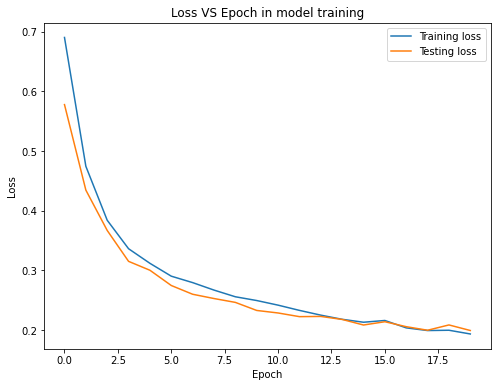

In [122]:
#Plot of loss of train and test
train_loss_IR=history_IR.history['loss']
test_loss_IR=history_IR.history['val_loss']

plt.figure(figsize=(8,6))

plt.plot(train_loss_IR, label='Training loss')
plt.plot(test_loss_IR, label='Testing loss')

plt.title('Loss VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend();

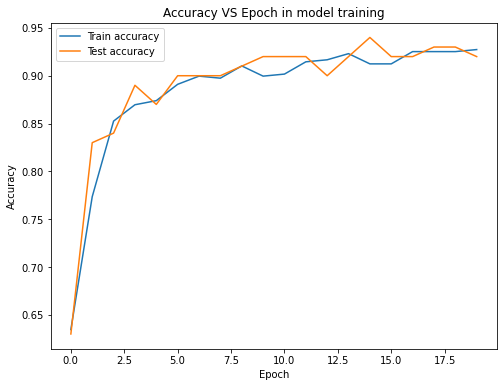

In [123]:
#Plot of train and test accuracy 
plt.figure(figsize=(8,6))

plt.plot(history_IR.history['Accuracy'], label='Train accuracy')
plt.plot(history_IR.history['val_Accuracy'], label='Test accuracy')

plt.title('Accuracy VS Epoch in model training')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend();

Conclusion:
- The optimal epoch is at 15th where the test accuracy is highest at 0.94 and the train accuracy at 0.91.
    - The trend of the test accuracy oscillates about 0.92 past the 15th epoch iteration suggesting that there might not be further improvements despite further iterations.
- There are no severe signs of overfitting at this epoch iteration where both test and train validation are closely aligned.
- Despite using a higher complexity CNN architecture, it does not provide much improvement to the performance as MobileNet architectures.
- The average training time for each epoch iteration is about 38 seconds which is significantly higher than MobileNet training time.
- Based on the current dataset in terms of it size and quality, it is not ideal to use a more complex model such as InceptionResNetV2 due to a significant increase in training time without improvement on performance.

In [124]:
# Load the model from the 15th epoch
model_path_IR = 'InceptionResNetV2_model/model.15.h5' 
loaded_model_IR = tf.keras.models.load_model(model_path_IR)

##### Misclassification

In [136]:
#Getting the image file path that were misclassified based on the selected model
misclassified_image_names_IR=misclassified_img(loaded_model_IR,'processed_img/Validation', val_data_IR,IR_input)

4/4 [==============================] - 11s 2s/step


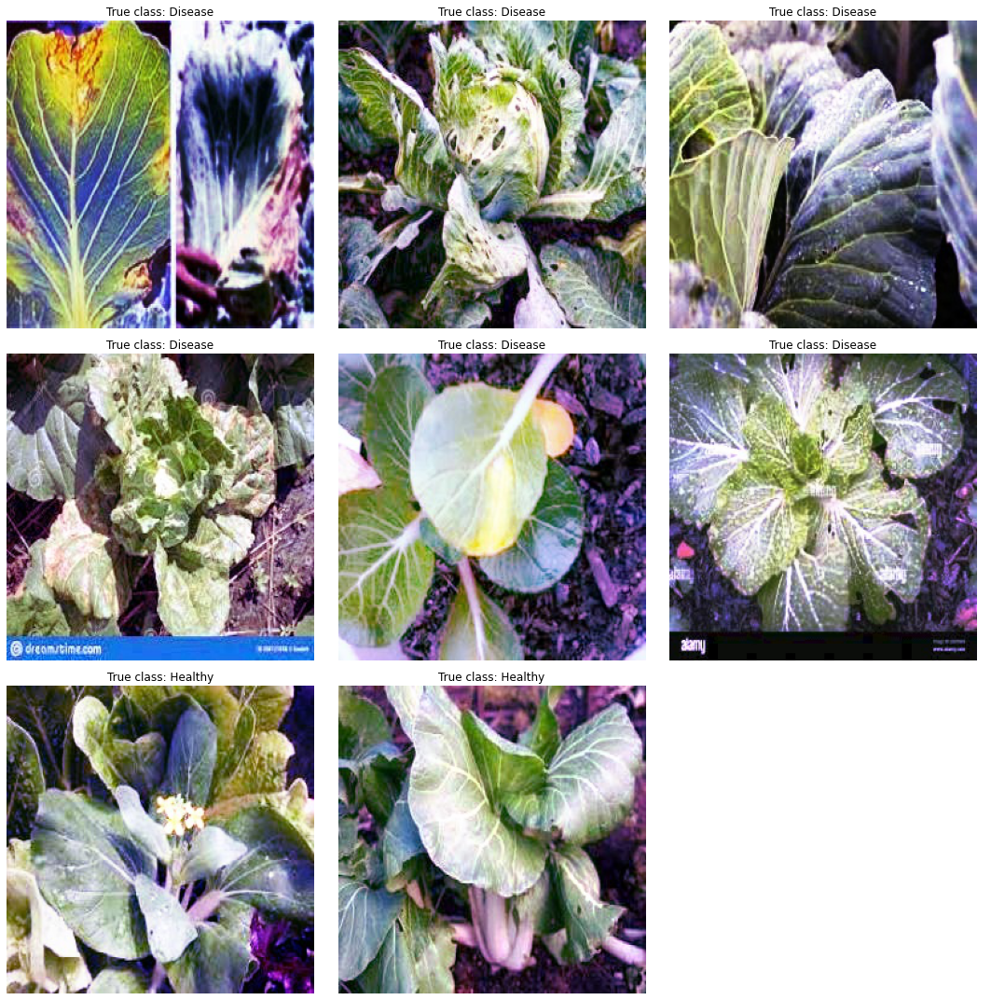

In [137]:
#View of misclassified images and their true class
view_misclass(misclassified_image_names_IR, 'processed_img/Validation/',3)

Conclusion:
- Majority of misclassifications are of the diseased class and there are no obvious charactertistics shared among these images that could explain such tendency.
- Similarly for the misclassification of the healthy class, there are no obvious shared characteristics.

#### 2.4.3.2 Images of vegetables with water droplets

##### Misclassification

In [138]:
#Getting the dataframe that capture the results of classification and the misclassified image filepaths
water_result_IR, image_path_IR =water_evaluation(loaded_model_IR)

1/1 [==============================] - 0s 131ms/step


In [139]:
#View of classification results
water_result_IR.sort_values(by='Classification Probability')

,Classification Result,Classification Probability
44,Diseased,0.010087
14,Diseased,0.010743
2,Diseased,0.048173
41,Diseased,0.055108
43,Diseased,0.067229
19,Diseased,0.129483
22,Diseased,0.156081
23,Diseased,0.159203
21,Diseased,0.258658
5,Diseased,0.269056


In [140]:
#Proportion of classification results
water_result_IR['Classification Result'].value_counts(normalize=True)

Diseased    0.844444
Healthy     0.155556
Name: Classification Result, dtype: float64

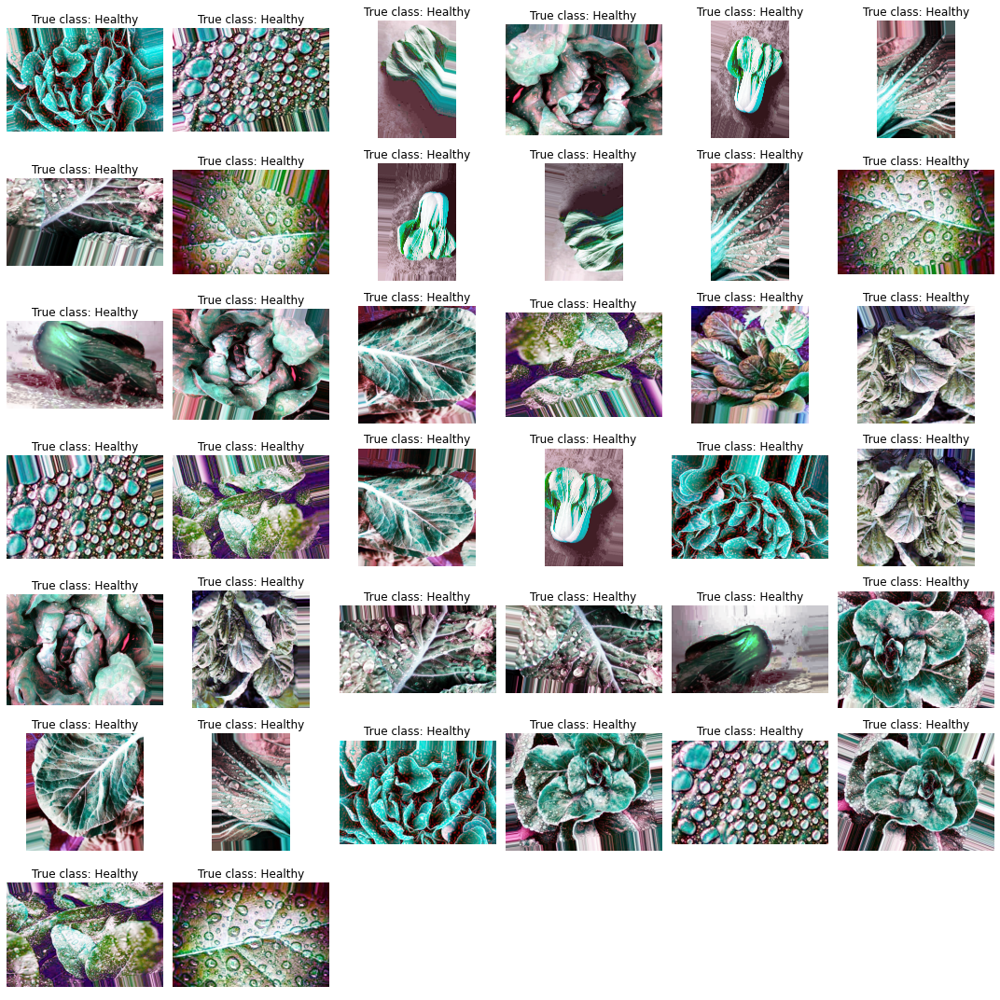

In [141]:
#View of misclassified images
view_misclass(image_path_IR, 'processed_augmented_images',6)

Conclusion:
- Poor results on classification with 16% in correctly classifying the images.
- Misclassified images consist of a mixture of close-up and wide-shot images, small and large water droplets.
- No specific characteristics shared among the images to explain the poor performance.
- Despite increasing complexity of the model have not significantly improve the results which suggest that probably with better quality and more quantity of data images on the vegetable with water droplets use for training might be the solution to improve classfication results.

# 3. Final Conclusion/Future works

## 3.1 Overal summary of approaches

|Approach|Description of Parameters|Performance|Conclusion|
|--|--|--|--|
|1|MobileNetV2 model <ul><li>CNN architecture:</li><ul><li>Average Pooling</li></ul><li>Fully Connected Layer:</li><ul><li>Loss function: Adam</li><li>Batch size: 32</li><li>Epochs:25</li></ul>|<li>Accuracy:</li><ul><li>Train: 0.96</li><li>Test: 0.97</li></ul><li>Loss:</li><ul><li>Train: 0.1257</li><li>Test: 0.1256</li></ul><li>Avg train time: 8secs</li>|**Best score** without overfitting on regular images but performed poorly on images with presence of water droplets (**27%** correctly classified as healthy and **numerous close to zero** prediction probabilities)|
|2|MobileNetV3 model <ul><li>CNN architecture:</li><li>Average Pooling</li><li>Fully Connected Layer:</li><ul><li>Loss function: Adam</li><li>Batch size: 32</li><li>Epochs:25</li></ul>|<li>Accuracy:</li><ul><li>Train: 0.94</li><li>Test: 0.94</li></ul><li>Loss:</li><ul><li>Train: 0.1796</li><li>Test: 0.1791</li></ul><li>Avg train time: 8secs</li>|**Acceptable score** without overfitting on regular images but performed poorly on images with presence of water droplets (**29%** correctly classified as healthy and **lesser close to zero** prediction probabilities)|
|3|MobileNetV3 model with Ridge regularization <ul><li>CNN architecture:</li><ul><li>Average Pooling</li><li>Ridge regularization alpha=0.01 </li></ul><li>Fully Connected Layer:</li><ul><li>Loss function: Adam</li><li>Batch size: 32</li><li>Epochs:30</li></ul>|<li>Accuracy:</li><ul><li>Train: 0.96</li><li>Test: 0.95</li></ul><li>Loss:</li><ul><li>Train: 0.1453</li><li>Test: 0.1462</li></ul><li>Avg train time: 8secs</li>|**Acceptable score** without overfitting on regular images but performed the worse on images with presence of water droplets (**2%** correctly classified as healthy and **lesser close to zero** prediction probabilities)|
|4|InceptionResNetV2 <ul><li>CNN architecture:</li><ul><li>Average Pooling</li></ul><li>Fully Connected Layer:</li><ul><li>Loss function: Adam</li><li>Batch size: 32</li><li>Epochs:20</li></ul>|<li>Accuracy:</li><ul><li>Train: 0.91</li><li>Test: 0.94</li></ul><li>Loss:</li><ul><li>Train: 0.2131</li><li>Test: 0.2085</li></ul><li>Avg train time: 38secs</li>|**Acceptable score** without overfitting on regular images but performed poorly as well on images with presence of water droplets (**15%** correctly classified as healthy and **numerous close to zero** prediction probabilities)|

Overall, the various models have acheived the objective of classifying with an accuracy of at least 90% on regular images but have shown limited success on images with the presence of water droplets where the models have tendencies to classify it as a diseased plant.

MobileNetV2 have the best results in classifying regular images (with 97% accuracy) but is considered to be one of the worst performing models on images with water droplets present as most classification on water droplet images are confidently incorrect.

Nonetheless, the selected model/approach is the **MobileNetV2** as the CNN architecture used in **approach 1**. It is selected due to its best performance on regular image classifications and its short training time needed. 

Despite the model being poorer than other models in classifying images with water droplets being present, the problem holds less relevance in the context of hydroponic farms:
- As the roots of the plants are watered instead of watering from a top-down approach thus it is less likely to have water droplets being present on the leaves.
- Likely for the farms to be under shelter as the vegetable is [prone to stress for over excessive sunglight and sub-optimal conditions when the pH values are not in the range of 6.0 to 7.0](https://luv2garden.com/how-to-grow-hydroponic-bok-choy/). Thus, the vegetables are protected from rainfall.

## 3.2 Limitations & Future works

### 3.2.1 Limitations

|Limitations|Prospective resolutions|
|--|--|
|**Limited applicability on outdoor farms with use of soil**<ul><li>Performance of classifciation of images with disturbances such as water droplets/debris on leaves have been poor due to niche data available for training.|Gather relevant higher quality image data collected from farmers for model training and validation purposes<ul>Relevant quality images include:<ul><li> images that fit the context (i.e water droplets presence)</li><li>images with appropriate distance of the object</li><li>quality of images so as to better capture distinct features</li></ul></ul>|
|**Questionable classification of low light (night) images performance**<ul><br><li>As mentioned that the downy mildew spores takes 8 to 12 hours for germination and infection to occur, the need for round the clock monitoring is necessary which includes night imaging.</li><br><li>The images used in training are taken under considerably sufficient light(images also under went histogram equalization in attempt to improve low contrast images) but have yet to be tested on images with the presence of low light which can hinders the ability to extract features of the image and thus its classification capability.</li><br><li>Hardware solutions such as night vision imaging(eg. infrared imaging) might not be useful to provide quality images for training</li></ul>|Use of promising low-light preprocessing model, [Learning to See in the Dark](https://arxiv.org/pdf/1805.01934v1.pdf), to enhance low light images.|

### 3.2.2 Future works

- There are many other existing CNN architectures that extracts the image features differently that have yet to be tested to solve this problem which might produce better results. Therefore, it can be explore with the use of [Neural Architecture Search](https://towardsdatascience.com/what-is-neural-architecture-search-and-why-should-you-care-1e22393de461) to "gridsearch" over the best CNN architectures and even its parameters.
- The model in current state can detect decently on visual symptoms of diseased plants but not able to classify the type of disease based on specific/different symptoms which would be useful as different disease requires different course of actions to protect the crops. Additionally, similar works can be done on other common local produce and their common diseases.
- Image classification on the presence of common and harmful pests such as the [Diamondback Moth](https://www.sfa.gov.sg/food-for-thought/article/detail/new-method-to-control-dbm#:~:text=The%20DBM%20is%20one%20of%20the%20most%20destructive%20insect%20pests%20of%20brassica%20crops) which thrives in local conditions and pose a threat on the yield of vegetables.
- Scale the [current deployed app](https://diseased-veg-image-classifier.streamlit.app/) to accept live feed of images to monitor crops as its current state only accept single images being passed manually which can be roll out to farmers for their self use.